In [1]:
# Import basic packages.
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import numpy as np

# Import packages for plots and maps. 
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import contextily as ctx
import plotly.express as px

# Import libraries for doing network analysis with open street map. 
import networkx as nx
import osmnx as ox

In [2]:
# Read the geojson from the prep notebook that has walkshed geometries.
grocery_chains=gpd.read_file('chain_with_neighborhood.geojson')

# Read the geojson from the prep notebook that has walkshed geometries.
walksheds=gpd.read_file('grocery_walksheds.geojson')

# Read the geojson from the prep notebook that has population access.
senior_grocery=gpd.read_file('senior_grocery.geojson')

# Read the geojson from the prep notebook that has census block group geometries.
bg_geometries=gpd.read_file('bg_geometries.geojson')

# Import LA City boundary directly from Los Angeles GeoHub. 
cityboundary_proj=gpd.read_file("https://maps.lacity.org/lahub/rest/services/Boundaries/MapServer/7/query?outFields=*&where=1%3D1&f=geojson").to_crs('epsg:6423')

# Import neighborhood boundaries directly from LA GeoHub.
neighborhoods=gpd.read_file(
    'https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson').to_crs('epsg:6423').rename(columns={'name' : 'neighborhood'})

Summarize for City of Los Angeles.

In [3]:
senior_sums = senior_grocery.sum(numeric_only=True)
senior_sums=pd.DataFrame(senior_sums).transpose()
senior_sums

,Total_Pop,pct_5_min,pct_10_min,pct_15_min,pct_none,Total Senior Pop,all_5_min,all_10_min,all_15_min,all_none,seniors_5_min,seniors_10_min,seniors_15_min,seniors_none
0,3910981.0,116.73652,547.707848,1127.944511,1555.055489,503991.0,168762.657954,801701.208596,1.659153e+06,2.251828e+06,19395.256738,92585.213086,196092.157282,307898.842718


In [4]:
# Sum up all of the data for all of the block groups in each category.
senior_sums = senior_grocery.sum(numeric_only=True)
senior_sums=pd.DataFrame(senior_sums).transpose()
senior_sums['pct_5_min']=round(100*senior_sums['all_5_min']/senior_sums['Total_Pop'])
senior_sums['pct_10_min']=round(100*senior_sums['all_10_min']/senior_sums['Total_Pop'])
senior_sums['pct_15_min']=round(100*senior_sums['all_15_min']/senior_sums['Total_Pop'])
senior_sums['pct_none']=round(100*senior_sums['all_none']/senior_sums['Total_Pop'])
senior_sums['seniors_pct_5_min']=round(100*senior_sums['seniors_5_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_pct_10_min']=round(100*senior_sums['seniors_10_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_pct_15_min']=round(100*senior_sums['seniors_15_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_none']=round(100*senior_sums['seniors_none']/senior_sums['Total Senior Pop'])


senior_sums_all=senior_sums[['pct_5_min','pct_10_min','pct_15_min','pct_none']]
senior_sums_all['population']='All Residents'
senior_sums_seniors=senior_sums[['seniors_pct_5_min','seniors_pct_10_min','seniors_pct_15_min','seniors_none']].rename(columns={
    'seniors_pct_5_min':'pct_5_min', 'seniors_pct_10_min':'pct_10_min', 'seniors_pct_15_min':'pct_15_min', 'seniors_none':'pct_none'})
senior_sums_seniors['population']='Seniors'
grocery_table=pd.concat([senior_sums_all,senior_sums_seniors])
grocery_table=grocery_table.reset_index().drop(columns=['index'])
grocery_table

/tmp/ipykernel_702/931847029.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  senior_sums_all['population']='All Residents'


,pct_5_min,pct_10_min,pct_15_min,pct_none,population
0,4.0,20.0,42.0,58.0,All Residents
1,4.0,18.0,39.0,61.0,Seniors


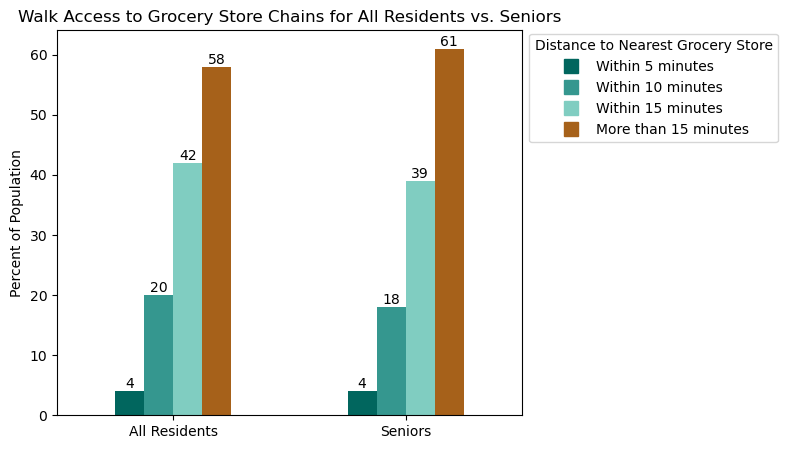

In [5]:
# Now I plot the pivot table.
fig, ax = plt.subplots(figsize=(6,5))

ax = grocery_table.plot(ax=ax, kind='bar',x='population', color=['#01665e','#35978f','#80cdc1','#a6611a'] , legend=True)
ax.bar_label(ax.containers[0], label_type='edge')
ax.bar_label(ax.containers[1], label_type='edge')
ax.bar_label(ax.containers[2], label_type='edge')
ax.bar_label(ax.containers[3], label_type='edge')

# Adjust x-axis.
plt.xlabel(None)
plt.xticks(rotation=0)

# Ajust y-axis.
plt.ylabel("Percent of Population")

#Adjust table and legend.
plt.title("Walk Access to Grocery Store Chains for All Residents vs. Seniors")

# build custom legend
legend_elements = [(Line2D([0], [0], marker='s', color='#01665e', linestyle='',label='Within 5 minutes', markersize=10)),
                  (Line2D([0], [0], marker='s', color='#35978f', linestyle='',label='Within 10 minutes', markersize=10)),
                  (Line2D([0], [0], marker='s', color='#80cdc1', linestyle='',label='Within 15 minutes', markersize=10)),
                  (Line2D([0], [0], marker='s', color='#a6611a', linestyle='',label='More than 15 minutes', markersize=10))]
plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, .85), title='Distance to Nearest Grocery Store')

plt.show()

Summarize by neighborhood.

In [6]:
# Create a new dataframe with totals for each neighborhood that sums up all relevant columns.
grocery_by_neighborhood = senior_grocery.groupby(['neighborhood']).sum(numeric_only=True).reset_index()

# Recalculate percentages.
grocery_by_neighborhood['pct_snr_5_min']=(grocery_by_neighborhood['seniors_5_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_10_min']=(grocery_by_neighborhood['seniors_10_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_15_min']=(grocery_by_neighborhood['seniors_15_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_none']=(grocery_by_neighborhood['seniors_none']/grocery_by_neighborhood['Total Senior Pop'])

# Finally, we have to add back in the geometry column from the original neighborhood geodataframe.
grocery_by_neighborhood=pd.merge(neighborhoods[['neighborhood','geometry']],grocery_by_neighborhood,how="left", on=['neighborhood'])

# Keep just necessary columns.
grocery_by_neighborhood=grocery_by_neighborhood[['neighborhood','geometry','pct_snr_5_min','pct_snr_10_min','pct_snr_15_min','pct_snr_none']]

# Add in neighborhood colors for mapping.
for index, row in grocery_by_neighborhood.iterrows():
    if grocery_by_neighborhood.loc[index, 'pct_snr_15_min'] < .1:
        grocery_by_neighborhood.loc[index, 'colors'] = '#a6611a'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_15_min'] < .3:
        grocery_by_neighborhood.loc[index, 'colors'] = '#dfc27d'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_15_min'] < .5:
        grocery_by_neighborhood.loc[index, 'colors'] = '#80cdc1'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_15_min'] < .8:
        grocery_by_neighborhood.loc[index, 'colors'] = '#35978f'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_15_min'] <= 1:
        grocery_by_neighborhood.loc[index, 'colors'] = '#01665e'
    else:
        grocery_by_neighborhood.loc[index, 'colors'] = '#f7f7f5'

# See how this table looks.
grocery_by_neighborhood.sort_values('pct_snr_none',ascending=True).head(5)

,neighborhood,geometry,pct_snr_5_min,pct_snr_10_min,pct_snr_15_min,pct_snr_none,colors
106,Westlake,"POLYGON ((1976080.190 561472.084, 1976010.254 ...",0.083579,0.440776,0.897137,0.102863,#01665e
43,Harvard Heights,"POLYGON ((1972240.553 560032.451, 1972223.927 ...",0.089863,0.456966,0.878488,0.121512,#01665e
52,Koreatown,"POLYGON ((1973426.406 562358.370, 1973427.701 ...",0.147267,0.544597,0.795689,0.204311,#35978f
49,Hollywood,"POLYGON ((1969734.109 567209.707, 1969839.499 ...",0.097670,0.457952,0.773800,0.226200,#35978f
80,Sawtelle,"POLYGON ((1959009.539 560789.257, 1959806.166 ...",0.104077,0.399226,0.716128,0.283872,#35978f


Calculate spatial lag.

In [7]:
# For spatial statistics
import libpysal as lps

# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(senior_grocery,k=8)

# Row-standardization
wq.transform = 'r'

# create a new column for the spatial lag
senior_grocery['pct_15_min_lag'] = lps.weights.lag_spatial(wq, senior_grocery['pct_15_min'])

# Add in colors for mapping.
for index, row in senior_grocery.iterrows():
    if senior_grocery.loc[index, 'Total_Pop']==0:
        senior_grocery.loc[index, 'colors_lag'] = '#f7f7f5'    
    elif senior_grocery.loc[index, 'pct_15_min_lag'] < 0.1:
        senior_grocery.loc[index, 'colors_lag'] = '#a6611a'
    elif senior_grocery.loc[index, 'pct_15_min_lag'] < .3:
        senior_grocery.loc[index, 'colors_lag'] = '#dfc27d'
    elif senior_grocery.loc[index, 'pct_15_min_lag'] < .5:
        senior_grocery.loc[index, 'colors_lag'] = '#80cdc1'
    elif senior_grocery.loc[index, 'pct_15_min_lag'] < .8:
        senior_grocery.loc[index, 'colors_lag'] = '#35978f'
    else: senior_grocery.loc[index, 'colors_lag'] = '#01665e'

Compare all three results.

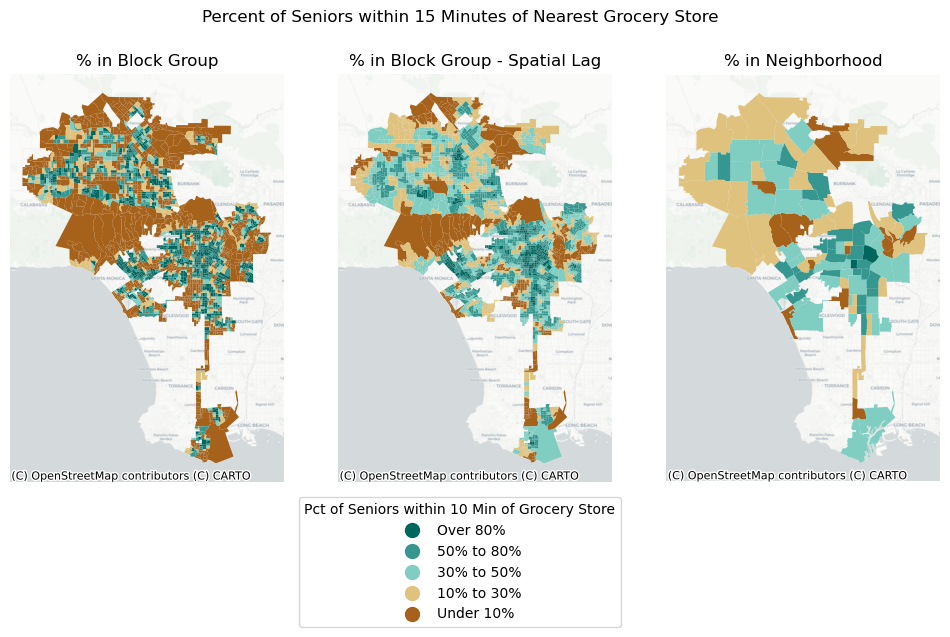

In [8]:
# Map all three subplots.
fig, ax = plt.subplots(1, 3, figsize=(12, 8))

senior_grocery.plot(ax=ax[0],color=senior_grocery['colors'])
ax[0].axis("off")
ax[0].set_title("% in Block Group")
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

# spatial lag map on the right
senior_grocery.plot(ax=ax[1],color=senior_grocery['colors_lag'])
ax[1].axis("off")
ax[1].set_title("% in Block Group - Spatial Lag")
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

# spatial lag map on the right
grocery_by_neighborhood.plot(ax=ax[2],color=grocery_by_neighborhood['colors'])
ax[2].axis("off")
ax[2].set_title("% in Neighborhood")
ctx.add_basemap(ax=ax[2], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

# build custom legend
legend_elements = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Over 80%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='50% to 80%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='30% to 50%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#dfc27d', linestyle='',label='10% to 30%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='Under 10%', markersize=10))]

fig.legend(handles=legend_elements,loc='lower center', bbox_to_anchor=(0.5,0.05), title="Pct of Seniors within 10 Min of Grocery Store")
fig.suptitle('Percent of Seniors within 15 Minutes of Nearest Grocery Store',x=0.5,y=.83)

plt.show()

In [9]:
busstops=gpd.read_file('transit_stops.geojson').to_crs('epsg:6423')

In [10]:
def neighborhood_map(neighborhood_list):
    # Loop through all neighborhoods to get their combined geographic extent.
    neighborhood_boundary=gpd.GeoDataFrame(columns=['OBJECTID', 'neighborhood', 'geometry'],crs="EPSG:6423")
    for i in neighborhood_list:
        boundary=neighborhoods[(neighborhoods["neighborhood"]==i)]
        neighborhood_boundary = pd.concat([neighborhood_boundary,boundary])
    # Overlay this new geographic extent with the walksheds to get just walksheds within the neighborhoods.    
    neighborhood_walkshed=gpd.overlay(walksheds,neighborhood_boundary,how='intersection', keep_geom_type=None, make_valid=True)
    # Clip point data to get just points within the neighborhoods.
    neighborhood_stores=gpd.clip(grocery_chains,neighborhood_boundary)
    neighborhood_stops=gpd.clip(busstops,neighborhood_boundary)
    
    # Set colors.
    neighborhood_boundary["colors"] = '#a6611a'

        
    # Make plot for all of these layers clipped to the desired neighborhoods.
    fig, ax= plt.subplots(figsize=(7,7))
    neighborhood_walkshed.plot(ax=ax,zorder=2,color=neighborhood_walkshed['colors'],alpha=.8)
    neighborhood_boundary.plot(ax=ax,zorder=1,color=neighborhood_boundary['colors'],alpha=0.4)
    neighborhood_stores.plot(ax=ax,zorder=4,marker='X',color='white', edgecolor='black',markersize=50)
    neighborhood_stops.plot(ax=ax,zorder=3,marker='o',color='#FFCF00', edgecolor='black',markersize=15)
    
    # Create custom legend
    from matplotlib.lines import Line2D
    legend_elements = [(Line2D([0], [0], marker='X', color='white', markeredgecolor='black', label='Grocery store location', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Grocery store within 5 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='Grocery store within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='Grocery store within 15 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='No walkable grocery store', markersize=10))]
    ax.legend(handles=legend_elements,loc='upper left', bbox_to_anchor=(1,.9), title="Distance to Nearest Grocery Store")
    
    # Customize axis, title, and basemap.
    ax.axis('off')
    title='Distance to nearest grocery store: '
    for i in neighborhood_list:
        title=title+i+', '
    title=title[:-2]    
    ax.set_title(title)
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


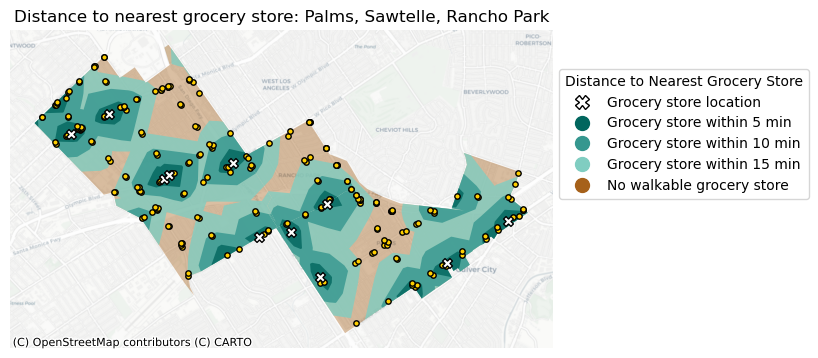

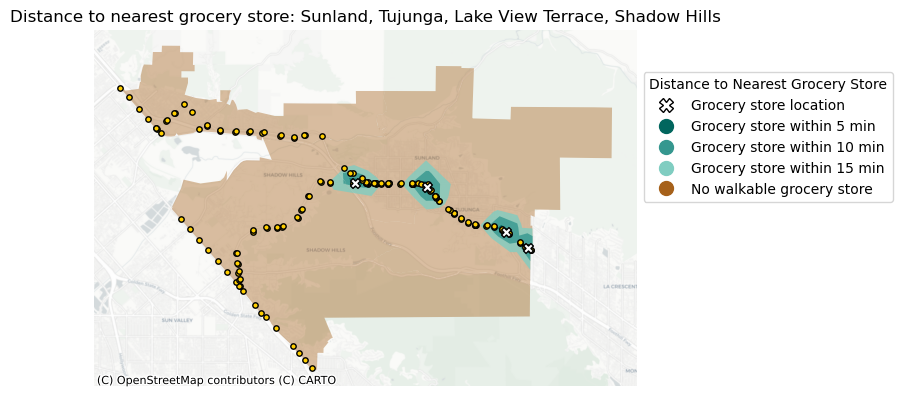

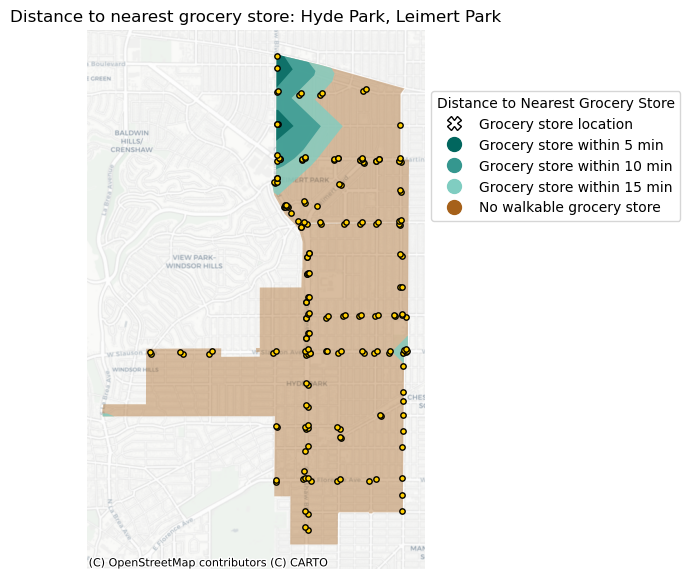

In [11]:
neighborhood_map(['Palms', 'Sawtelle', 'Rancho Park'])
neighborhood_map(['Sunland', 'Tujunga', 'Lake View Terrace', 'Shadow Hills'])
neighborhood_map(['Hyde Park', 'Leimert Park'])

In [12]:
# Senior population
seniors_index=gpd.read_file('Percent_Senior_Basemap.geojson').to_crs('epsg:6423')
seniors_index=seniors_index[['BG20','Total Pop','Pct Seniors']]
seniors_index.sample(3)

# Grocery store access.
grocery_index=senior_grocery[['BG20','pct_none','geometry']]
grocery_index['pct_none']=grocery_index['pct_none']*100

# Senior vehicle access
vehicle_index=gpd.read_file('vehicle_access.geojson')
vehicle_index=vehicle_index[['BG20','Pct Senior-Headed Households Without a Vehicle']]

# Transit stop density
transit_index=pd.read_csv('transit_stopcount.csv')
transit_index=transit_index[['BG20','stopdensity']]
transit_index['BG20']=transit_index['BG20'].astype(str)

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [13]:
# Merge
bg_priority=pd.merge(grocery_index,seniors_index,how='left',on=['BG20'])
bg_priority=pd.merge(bg_priority,vehicle_index,how='left',on=['BG20'])
bg_priority=pd.merge(bg_priority,transit_index,how='left',on=['BG20'])
bg_priority['stopdensity']=bg_priority['stopdensity'].fillna(0)
bg_priority.sample(3)

# Calculate z-scores.
from scipy import stats
bg_priority['seniors_z']=stats.zscore(bg_priority['Pct Seniors'], nan_policy='omit')
bg_priority['vehicle_z']=stats.zscore(bg_priority['Pct Senior-Headed Households Without a Vehicle'], nan_policy='omit')
bg_priority['grocery_z']=stats.zscore(bg_priority['pct_none'], nan_policy='omit')
bg_priority['transit_z']=stats.zscore(bg_priority['stopdensity'], nan_policy='omit')
bg_priority.describe()

# Average z-scores for available data.
bg_priority['Priority_Index']=(bg_priority['seniors_z']+bg_priority['vehicle_z']+bg_priority['grocery_z']+bg_priority['transit_z'])/4
bg_priority.loc[bg_priority['Pct Senior-Headed Households Without a Vehicle'].isna(), 'Priority_Index'] = (bg_priority['seniors_z']+bg_priority['grocery_z']+bg_priority['transit_z'])/3

In [14]:
# For spatial statistics
import libpysal as lps

# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(bg_priority,k=8)
# Row-standardization
wq.transform = 'r'
# create a new column for the spatial lag
bg_priority['priority_lag'] = lps.weights.lag_spatial(wq, bg_priority['Priority_Index'])

In [15]:
neighborhoods.explore()

In [16]:
bg_priority.explore(column='priority_lag',scheme='quantiles',cmap='RdYlGn_r')